In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import os
from collections import Counter
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedShuffleSplit

import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff


from pandas import Timestamp
import time
from sklearn.manifold import TSNE

seed = 42
np.random.seed(seed)
os.environ['KMP_DUPLICATE_LIB_OK']='True'

df = pd.read_csv('./datasets/creditcard.csv')
df.head()



,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [2]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
Time      284807 non-null float64
V1        284807 non-null float64
V2        284807 non-null float64
V3        284807 non-null float64
V4        284807 non-null float64
V5        284807 non-null float64
V6        284807 non-null float64
V7        284807 non-null float64
V8        284807 non-null float64
V9        284807 non-null float64
V10       284807 non-null float64
V11       284807 non-null float64
V12       284807 non-null float64
V13       284807 non-null float64
V14       284807 non-null float64
V15       284807 non-null float64
V16       284807 non-null float64
V17       284807 non-null float64
V18       284807 non-null float64
V19       284807 non-null float64
V20       284807 non-null float64
V21       284807 non-null float64
V22       284807 non-null float64
V23       284807 non-null float64
V24       284807 non-null float64
V25       284807 non-null float64
V26  

In [3]:
df.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,1.165980e-15,3.416908e-16,-1.373150e-15,2.086869e-15,9.604066e-16,1.490107e-15,-5.556467e-16,1.177556e-16,-2.406455e-15,...,1.656562e-16,-3.444850e-16,2.578648e-16,4.471968e-15,5.340915e-16,1.687098e-15,-3.666453e-16,-1.220404e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


In [64]:
fraud = df[(df['Class'] != 0)]
normal = df[(df['Class'] == 0)]


trace = go.Pie(labels = ['Normal', 'Fraud'], values = df['Class'].value_counts(), 
               textfont=dict(size=15), opacity = 0.8,
               marker=dict(colors=['#108785','#7a260f'], 
                           line=dict(color='#ffffff', width=1.5)))


layout = dict(title =  'Distribution of target variable')
           
fig = dict(data = [trace], layout=layout)
py.iplot(fig)


In [66]:
trace1 = go.Histogram(
    x=normal.Class.values,
    opacity=0.75,
    marker=dict(
        color='#108785',
    )
)

trace2 = go.Histogram(
    x=fraud.Class.values,
    opacity=0.75,
    marker=dict(
        color='#7a260f',
    )
)
data = [trace1, trace2]
layout = go.Layout(barmode='overlay')
fig = go.Figure(data=data, layout=layout)

py.iplot(data, filename='basic histogram')


In [6]:
from sklearn.preprocessing import StandardScaler, RobustScaler

std_scaler = StandardScaler()
rob_scaler = RobustScaler()

df['scaled_amount'] = rob_scaler.fit_transform(df['Amount'].values.reshape(-1,1))
df['scaled_time'] = rob_scaler.fit_transform(df['Time'].values.reshape(-1,1))

df.drop(['Time','Amount'], axis=1, inplace=True)

## Load data

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
V1               284807 non-null float64
V2               284807 non-null float64
V3               284807 non-null float64
V4               284807 non-null float64
V5               284807 non-null float64
V6               284807 non-null float64
V7               284807 non-null float64
V8               284807 non-null float64
V9               284807 non-null float64
V10              284807 non-null float64
V11              284807 non-null float64
V12              284807 non-null float64
V13              284807 non-null float64
V14              284807 non-null float64
V15              284807 non-null float64
V16              284807 non-null float64
V17              284807 non-null float64
V18              284807 non-null float64
V19              284807 non-null float64
V20              284807 non-null float64
V21              284807 non-null float64
V22              284807 non-

In [8]:
X = df.drop('Class', axis=1)
y = df.dropna()['Class']


In [9]:
feat_cols = X.columns

### T-SNE

In [10]:
# T-SNE Implementation
import matplotlib.patches as mpatches

rndperm = np.random.permutation(X.count()[0])
n_sne = 5000

t0 = time.time()
tsne = TSNE(n_components=3, verbose=1, perplexity=40, n_iter=300, random_state=42)
X_reduced_tsne = tsne.fit_transform(X.loc[rndperm[:n_sne],feat_cols].values) #
t1 = time.time()
print("T-SNE took {:.2} s".format(t1 - t0))


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.005s...
[t-SNE] Computed neighbors for 5000 samples in 1.453s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 1.442641
[t-SNE] KL divergence after 250 iterations with early exaggeration: 77.915352
[t-SNE] KL divergence after 300 iterations: 1.663939
T-SNE took 6.1e+01 s


In [11]:
trace1 = go.Scatter3d(
    x=X_reduced_tsne[:,0],
    y=X_reduced_tsne[:,1],
    z=X_reduced_tsne[:,2],
    mode='markers',
    marker=dict(
        size=5,
        color=y.loc[rndperm[:n_sne]], # set color to an array/list of desired values
        colorscale=[[0.0,'#108785'], [1.0,'#7a260f']], #'Viridis',   # choose a colorscale
        opacity=.8
        
    )
)

data = [trace1]
layout = go.Layout(
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=0
    )
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='3d-scatter-colorscale')



## Split

In [12]:
sss = StratifiedShuffleSplit(n_splits=5, test_size=0.2, random_state=seed)

for train_index, test_index in sss.split(X, y):
    original_Xtrain, original_Xtest = X.iloc[train_index], X.iloc[test_index]
    original_ytrain, original_ytest = y.iloc[train_index], y.iloc[test_index]



train Counter({0: 227451, 1: 394}) 0.9982707542408216 0.001729245759178389
test Counter({0: 56864, 1: 98}) 0.9982795547909132 0.0017204452090867595


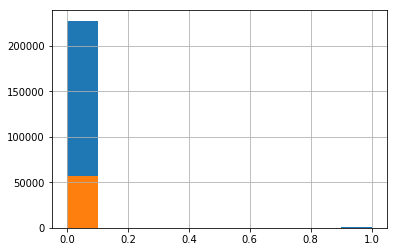

In [13]:
# Check the Distribution of the labels

for arr,t in zip((original_ytrain,original_ytest),("train","test")):
    print(t,Counter(arr),Counter(arr)[0]/ len(arr), Counter(arr)[1]/ len(arr))
original_ytrain.hist()
original_ytest.hist()


### Performance Metrics

In [177]:
from sklearn.metrics import roc_curve, auc, roc_auc_score, precision_recall_curve
from sklearn.metrics import recall_score, precision_score, confusion_matrix, f1_score, average_precision_score

def model_performance(model, model_name, y_pred, y_pred_prob) : 
    #Conf matrix
    conf_matrix = confusion_matrix(y_test, y_pred)
    trace1 = go.Heatmap(z = conf_matrix  ,x = ["0 (pred)","1 (pred)"],
                        y = ["0 (true)","1 (true)"],xgap = 2, ygap = 2, 
                        colorscale = 'Cividis', showscale  = False)

    #Show metrics
    tn, fp, fn, tp = conf_matrix.ravel()
    Accuracy  =  ((tp+tn)/(tp+tn+fp+fn))
    Precision =  (tp/(tp+fp))
    Recall    =  (tp/(tp+fn))
    F1_score  =  (2*((Precision*Recall)/(Precision+Recall)))

    show_metrics = pd.DataFrame(data=[[Accuracy , Precision, Recall, F1_score]])
    show_metrics = show_metrics.T

    colors = ['rgb(43,45,104)', 'rgb(158,202,225)', 'rgb(149,203,150)', 'rgb(205,185,57)']
    trace2 = go.Bar(x = (show_metrics[0].values), 
                   y = ['Accuracy', 'Precision', 'Recall', 'F1_score'], text = np.round_(show_metrics[0].values,4),
                    textposition = 'auto',
                   orientation = 'h', opacity = 0.8,marker=dict(
            color=colors,
            line=dict(color='#000000',width=1.5)))
    
    #Roc curve
    model_roc_auc = round(roc_auc_score(y_test, y_pred_prob[:,1]) , 3)
    fpr, tpr, t = roc_curve(y_test, y_pred_prob[:,1])
    trace3 = go.Scatter(x = fpr,y = tpr,
                        name = "Roc : {}".format(model_roc_auc),
                        line = dict(color = ('Turquoise'),width = 2), fill='tozeroy')
    
    trace4 = go.Scatter(x = [0,1],y = [0,1],
                        line = dict(color = ('black'),width = 1.5,
                        dash = 'dot'))
    
    # Precision-recall curve
    precision, recall, thresholds = precision_recall_curve(y_test, y_pred_prob[:,1])
    trace5 = go.Scatter(x = recall, y = precision,
                        name = "Precision {}".format(precision),
                        line = dict(color = ('#FFCCCC'),width = 2), fill='tozeroy')
    model_average_precision_score = average_precision_score(y_test, y_pred_prob[:,1])
    

    
    #Feature importance
    coefficients  = pd.DataFrame(model.named_steps.rf.feature_importances_)
    column_data   = pd.DataFrame(list(X))
    coef_sumry    = (pd.merge(coefficients,column_data,left_index= True,
                              right_index= True, how = "left"))
    coef_sumry.columns = ["coefficients","features"]
    coef_sumry    = coef_sumry.sort_values(by = "coefficients",ascending = False)
    coef_sumry = coef_sumry[coef_sumry["coefficients"] !=0]
    trace6 = go.Bar(x = coef_sumry["features"],y = coef_sumry["coefficients"],
                    name = "coefficients",
                    marker = dict(color = coef_sumry["coefficients"],
                                  colorscale = "Viridis",
                                  line = dict(width = .6,color = "black")))
    
    #Subplots
    fig = tls.make_subplots(rows=3, cols=2, print_grid=False, 
                          specs=[[{}, {}], 
                                 [{}, {}],
                                 [{'colspan': 2}, None]],
                          subplot_titles=('Confusion Matrix',
                                        'Metrics',
                                        'ROC curve {}'.format(round(model_roc_auc,3)),
                                        'Precision - Recall curve {}'.format(round(model_average_precision_score, 3)),
                                        'Cumulative gains curve',
                                        ))
    
    fig.append_trace(trace1,1,1)
    fig.append_trace(trace2,1,2)
    fig.append_trace(trace3,2,1)
    fig.append_trace(trace4,2,1)
    fig.append_trace(trace5,2,2)
    fig.append_trace(trace6,3,1)
    
    fig['layout'].update(showlegend = False, title = '<b>Model performance report</b><br>'+str(model),
                        autosize = False, height = 1500,width = 830,
                        plot_bgcolor = 'rgba(240,240,240, 0.95)',
                        paper_bgcolor = 'rgba(240,240,240, 0.95)',
                        margin = dict(b = 195))
    fig["layout"]["xaxis2"].update((dict(range=[0, 1])))
    fig["layout"]["xaxis3"].update(dict(title = "false positive rate"))
    fig["layout"]["yaxis3"].update(dict(title = "true positive rate"))
    fig["layout"]["xaxis4"].update(dict(title = "recall"), range = [0,1.05])
    fig["layout"]["yaxis4"].update(dict(title = "precision"), range = [0,1.05])
    fig["layout"]["xaxis5"].update(dict(title = "Percentage contacted"))
    fig["layout"]["yaxis5"].update(dict(title = "Percentage positive targeted"))
    fig.layout.titlefont.size = 14
    
    py.iplot(fig)

## Modeling 

In [14]:
from imblearn.over_sampling import SMOTE  
from imblearn.pipeline import Pipeline as imbPipeline

from sklearn.datasets import make_classification
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import (GridSearchCV,
                                     train_test_split,
                                     StratifiedKFold)


In [16]:
x_train = original_Xtrain.astype('float32')
x_test = original_Xtest.astype('float32')

y_train = original_ytrain.values
y_test = original_ytest.values

print('x_train shape:', x_train.shape)
print(x_train.shape[0], 'train samples')
print(x_test.shape[0], 'test samples')

x_train shape: (227845, 30)
227845 train samples
56962 test samples


In [17]:
data_train = x_train.copy()
data_train['Class'] = y_train

data_test = x_test.copy()
data_test['Class'] = y_test

data_train.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V22,V23,V24,V25,V26,V27,V28,scaled_amount,scaled_time,Class
241684,1.909340,-0.457347,0.475223,1.407733,-1.206369,-0.073364,-1.159419,0.256907,1.643779,0.176490,...,0.842800,0.226435,-0.073132,-0.371020,-0.578305,0.091224,-0.020911,-0.300566,0.780566,0
223467,1.822855,-0.723899,-0.025319,0.305542,-0.862210,0.132617,-0.892819,0.179212,1.051880,0.119951,...,0.373016,0.207577,-0.358599,-0.582778,0.369893,-0.012693,-0.038325,0.669322,0.689658,0
136928,-2.613518,0.810720,1.419855,-0.126195,-1.748517,0.177692,0.407727,-0.076550,1.307600,1.559375,...,1.066903,0.054934,0.565727,-0.560306,0.295385,-0.180915,0.832053,2.102844,-0.032355,0
100145,-0.591143,1.311545,1.206869,0.010935,0.080337,-1.015560,0.710192,-0.094124,-0.294246,-0.215779,...,-0.662140,-0.007295,0.347363,-0.086503,0.074397,0.351198,0.169130,-0.294977,-0.202798,0
123687,-0.692332,1.048710,0.446243,0.354740,0.850996,0.288000,0.096750,0.478631,-0.911233,-0.746783,...,-0.571314,-0.098841,-1.326472,-0.433270,0.277451,0.027448,0.034479,-0.279746,-0.090097,0


## Random under-sampling


In [28]:
# Class count
train_count_class_0, train_count_class_1 = data_train.Class.value_counts()
test_count_class_0, test_count_class_1 = data_test.Class.value_counts()

# Divide by classClass
train_class_0 = data_train[data_train.Class == 0]
train_class_1 = data_train[data_train.Class == 1]


Random under-sampling:
1    394
0    394
Name: Class, dtype: int64


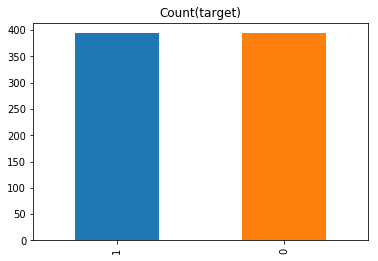

In [29]:
class_0_under = train_class_0.sample(train_count_class_1,random_state=seed)
train_under = pd.concat([class_0_under, train_class_1], axis=0)

print('Random under-sampling:')
print(train_under.Class.value_counts())

train_under.Class.value_counts().plot(kind='bar', title='Count(target)');


In [30]:
X = train_under[feat_cols]
y = train_under.Class.values
x_train = X.astype('float32')

y_train = train_under.Class.values
y_test = original_ytest.values

print('x_train shape:', x_train.shape)
print(x_train.shape[0], 'train samples')
print(x_test.shape[0], 'test samples')



x_train shape: (788, 30)
788 train samples
56962 test samples


### T-SNE

In [31]:
# T-SNE Implementation

t0 = time.time()
tsne = TSNE(n_components=3, verbose=1, perplexity=40, n_iter=300, random_state=42)
X_reduced_tsne = tsne.fit_transform(X.values) #
t1 = time.time()
print("T-SNE took {:.2} s".format(t1 - t0))


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 788 samples in 0.001s...
[t-SNE] Computed neighbors for 788 samples in 0.039s...
[t-SNE] Computed conditional probabilities for sample 788 / 788
[t-SNE] Mean sigma: 2.621267
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.309380
[t-SNE] KL divergence after 300 iterations: 1.168013
T-SNE took 5.9 s


In [32]:
trace1 = go.Scatter3d(
    x=X_reduced_tsne[:,0],
    y=X_reduced_tsne[:,1],
    z=X_reduced_tsne[:,2],
    mode='markers',
    marker=dict(
        size=5,
        color=y, # set color to an array/list of desired values
        colorscale=[[0.0,'#108785'], [1.0,'#7a260f']], #'Viridis',   # choose a colorscale
        opacity=.8
        
    )
)

data = [trace1]
layout = go.Layout(
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=0
    )
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='3d-scatter-colorscale')



In [34]:
pipe = imbPipeline([
    ('rf', RandomForestClassifier(random_state=42, n_jobs=-1))
    ])

skf = StratifiedKFold()
param_grid = {'rf__max_depth':[9,10,11,13],
              'rf__max_features': ['sqrt', .3, .2],
              'rf__n_estimators': [150,200,250],
              'rf__verbose': [1]
             }
grid_under = GridSearchCV(pipe, param_grid, return_train_score=False,
                    n_jobs=-1, scoring='roc_auc', cv=skf, verbose=1)
grid_under.fit(x_train, y_train)
grid_under.score(x_test, y_test)
#

Fitting 3 folds for each of 36 candidates, totalling 108 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done 108 out of 108 | elapsed:   15.8s finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:    0.2s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:    0.2s
[Parallel(n_jobs=8)]: Done 200 out of 200 | elapsed:    0.2s finished


0.9795311836045617

In [99]:
grid_under.best_estimator_

Pipeline(memory=None,
     steps=[('rf', RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=10, max_features=0.2, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=200, n_jobs=-1,
            oob_score=False, random_state=42, verbose=1, warm_start=False))])

In [36]:
rf_model_under = grid_under.best_estimator_

### Results

In [103]:
y_pred_under = rf_model_under.predict(x_test)
y_pred_prob_under = rf_model_under.predict_proba(x_test)


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:    0.2s
[Parallel(n_jobs=8)]: Done 200 out of 200 | elapsed:    0.2s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:    0.2s
[Parallel(n_jobs=8)]: Done 200 out of 200 | elapsed:    0.2s finished


In [104]:
print(classification_report(y_test, y_pred_under, target_names=["normal", "fraud"]))

              precision    recall  f1-score   support

      normal       1.00      0.98      0.99     56864
       fraud       0.09      0.90      0.16        98

   micro avg       0.98      0.98      0.98     56962
   macro avg       0.54      0.94      0.58     56962
weighted avg       1.00      0.98      0.99     56962



In [167]:
model_performance(rf_model_under, 'under', y_pred_under, y_pred_prob_under)

## SMOTE 

In [39]:
data_train.Class.value_counts()

0    227451
1       394
Name: Class, dtype: int64

### Over sample train

In [40]:
#lets fit SMOTE
from imblearn.combine import SMOTEENN
from imblearn.over_sampling import ADASYN


#smote_enn = SMOTEENN(random_state=seed)
adasyn = ADASYN(random_state=seed)
#x_train_smote, y_train_smote = smote_enn.fit_sample(data_train[feat_cols], data_train.Class)
x_train_adasyn, y_train_adasyn = adasyn.fit_sample(data_train[feat_cols], data_train.Class)


In [43]:
x_train_adasyn.shape

(454921, 30)

In [44]:

x_train_adasyn = x_train_adasyn.astype('float32')

print('x_train shape:', x_train.shape)
print(x_train_adasyn.shape[0], 'train samples')
print(x_test.shape[0], 'test samples')

x_train shape: (788, 30)
454921 train samples
56962 test samples


In [45]:
Counter(y_train_adasyn)


Counter({0: 227451, 1: 227470})

### T-SNE

In [46]:
# T-SNE Implementation
import matplotlib.patches as mpatches

print(y_train_adasyn.shape[0])
rndperm = np.random.permutation(y_train_adasyn.shape[0])
n_sne = 5000
print(n_sne)

t0 = time.time()
tsne = TSNE(n_components=3, verbose=1, perplexity=40, n_iter=300, random_state=42)
X_reduced_tsne = tsne.fit_transform(x_train_adasyn[rndperm[:n_sne]])
t1 = time.time()
print("T-SNE took {:.2} s".format(t1 - t0))


454921
5000
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.004s...
[t-SNE] Computed neighbors for 5000 samples in 1.191s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 1.599404
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.436638
[t-SNE] KL divergence after 300 iterations: 1.305077
T-SNE took 4.6e+01 s


In [47]:
trace1 = go.Scatter3d(
    x=X_reduced_tsne[:,0],
    y=X_reduced_tsne[:,1],
    z=X_reduced_tsne[:,2],
    mode='markers',
    marker=dict(
        size=5,
        color=y_train_adasyn[rndperm[:n_sne]], # set color to an array/list of desired values
        colorscale=[[0.0,'#108785'], [1.0,'#7a260f']], #'Viridis',   # choose a colorscale
        opacity=.8
        
    )
)

data = [trace1]
layout = go.Layout(
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=0
    )
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='3d-scatter-colorscale')



In [49]:
pipe = imbPipeline([
    ('smote', SMOTEENN(random_state=7)),
    ('rf', RandomForestClassifier(random_state=7, n_jobs=-1,verbose=1))
    ])

skf = StratifiedKFold(n_splits=3)
param_grid = {'rf__max_depth':[11,12,15],
              'rf__max_features': [0.2, 0.3],
              'rf__n_estimators': [307, 401],
             }
grid = GridSearchCV(pipe, param_grid, return_train_score=False,
                    n_jobs=-1, scoring='roc_auc', cv=skf, verbose=1)
grid.fit(x_train_adasyn, y_train_adasyn)
grid.score(x_test, y_test)
#

Fitting 3 folds for each of 12 candidates, totalling 36 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
/Users/xebia/anaconda3/lib/python3.6/site-packages/sklearn/externals/joblib/externals/loky/process_executor.py:706: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.

/Users/xebia/anaconda3/lib/python3.6/site-packages/sklearn/externals/joblib/externals/loky/process_executor.py:706: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.

/Users/xebia/anaconda3/lib/python3.6/site-packages/sklearn/externals/joblib/externals/loky/process_executor.py:706: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.

/Users/xebia/anaconda3/lib/python3.6/site-packages/sklearn/externals/joblib/externals/loky/process_executor.py:706: UserWarning:

A worker

0.9887377186383839

In [50]:
rf_model_smote = grid.best_estimator_

In [51]:
rf_model_smote.steps[1]

('rf',
 RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
             max_depth=15, max_features=0.2, max_leaf_nodes=None,
             min_impurity_decrease=0.0, min_impurity_split=None,
             min_samples_leaf=1, min_samples_split=2,
             min_weight_fraction_leaf=0.0, n_estimators=307, n_jobs=-1,
             oob_score=False, random_state=7, verbose=1, warm_start=False))

### Results

In [105]:
y_pred_smote = rf_model_smote.predict(x_test)
y_pred_prob_smote = rf_model_smote.predict_proba(x_test)


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:    0.3s
[Parallel(n_jobs=8)]: Done 307 out of 307 | elapsed:    0.4s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:    0.3s
[Parallel(n_jobs=8)]: Done 307 out of 307 | elapsed:    0.4s finished


In [169]:
print(classification_report(y_test, y_pred_smote, target_names=["normal", "fraud"]))

              precision    recall  f1-score   support

      normal       1.00      1.00      1.00     56864
       fraud       0.29      0.84      0.43        98

   micro avg       1.00      1.00      1.00     56962
   macro avg       0.65      0.92      0.72     56962
weighted avg       1.00      1.00      1.00     56962



In [168]:
model_performance(rf_model_smote, 'smote model', y_pred_smote, y_pred_prob_smote)

### Penalisation

In [18]:
pipe = imbPipeline([
    ('rf', RandomForestClassifier(random_state=42, n_jobs=-1, 
                                  class_weight="balanced"))
    ])

skf = StratifiedKFold()
param_grid = {'rf__max_depth':[7,9,11],
              'rf__max_features': ['sqrt', 'log2'],
              'rf__n_estimators': [100,200,300]
             }
grid = GridSearchCV(pipe, param_grid, return_train_score=False,
                    n_jobs=-1, scoring='roc_auc', cv=skf, verbose=1)
grid.fit(x_train, y_train)
grid.score(x_test, y_test)
#

Fitting 3 folds for each of 18 candidates, totalling 54 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done  54 out of  54 | elapsed: 18.5min finished


0.9825096470777394

In [123]:
rf_model_penal = grid.best_estimator_

In [21]:
count_class = Counter(original_ytrain)
class_weight = {0 : 1., 1 : count_class[0]/count_class[1]}
class_weight

{0: 1.0, 1: 577.2868020304569}

### Results

In [23]:
y_pred_penal = rf_model_penal.predict(x_test)
y_pred_prob_penal = rf_model_penal.predict_proba(x_test)


In [124]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred_penal, target_names=["normal", "fraud"]))


              precision    recall  f1-score   support

      normal       1.00      1.00      1.00     56864
       fraud       0.72      0.87      0.79        98

   micro avg       1.00      1.00      1.00     56962
   macro avg       0.86      0.93      0.89     56962
weighted avg       1.00      1.00      1.00     56962



In [178]:
model_performance(rf_model_penal, 'penal', y_pred_penal, y_pred_prob_penal)

In [211]:
from plotly import tools

#Roc curve under-sampling
model_roc_auc = round(roc_auc_score(y_test, y_pred_prob_under[:,1]) , 3)
fpr, tpr, t = roc_curve(y_test, y_pred_prob_under[:,1])
trace1 = go.Scatter(x = fpr,y = tpr,
                    name = "under : {}".format(model_roc_auc),
                    line = dict(color = ('cyan'),width = 2), fillcolor=None)
#Roc curve smote
model_roc_auc = round(roc_auc_score(y_test, y_pred_prob_smote[:,1]) , 3)
fpr, tpr, t = roc_curve(y_test, y_pred_prob_smote[:,1])
trace2 = go.Scatter(x = fpr,y = tpr,
                    name = "smote : {}".format(model_roc_auc),
                    line = dict(color = ('lightgreen'),width = 2))

#Roc curve smote
model_roc_auc = round(roc_auc_score(y_test, y_pred_prob_penal[:,1]) , 3)
fpr, tpr, t = roc_curve(y_test, y_pred_prob_penal[:,1])
trace3 = go.Scatter(x = fpr,y = tpr,
                    name = "penal : {}".format(model_roc_auc),
                    line = dict(color = ('salmon'),width = 2))

trace4 = go.Scatter(x = [0,1],y = [0,1], name="mean",
                    line = dict(color = ('black'),width = 1.5,
                    dash = 'dot'))

data = [trace1, trace2, trace3, trace4]
layout = go.Layout(title="Comparison of SMOTE, Under-Sampling, and Penalisation.")
fig = go.Figure(data=data, layout=layout, )
py.iplot(fig, filename='stacked-subplots-shared-x-axis')


In [216]:
np.bincount(y_test)
n_samples = len(y_test)
n_classes = 2

In [217]:
n_samples / (n_classes * np.bincount(y_test))

array([  0.50086171, 290.62244898])